# Introduction to Unsupervised Learning Methods

This notebook demonstrates the application of various unsupervised learning methods to analyze cybersecurity threat data. We'll explore techniques such as:

1. **K-Means Clustering** - For partitioning data into distinct groups
2. **DBSCAN** - For density-based clustering and anomaly detection
3. **Hierarchical Clustering** - For creating a hierarchical structure of clusters

These techniques will help us identify patterns and group similar cybersecurity threats together based on their characteristics without using labeled data.

**Global Cybersecurity Threats (2015–2024)**

**Size and Diversity:** The dataset contains 3,000 rows and 10 columns, covering 10 countries and 6 types of cyberattacks over a 10-year period (2015–2024). This diversity allows models to learn from a wide range of scenarios but also introduces complexity due to the varying frequencies of attack types.

**Imbalanced Classes:** The dataset is imbalanced, with some attack types (e.g., Phishing and DDoS) being more frequent than others (such as SQL Injection and Man-in-the-Middle attacks). This imbalance affects model performance, as they tend to perform better on the majority classes and struggle with the minority ones.

**Financial Loss Data:** The dataset includes statistics on financial losses, which could be a key feature for predicting the severity of attacks. However, the models may not have effectively leveraged this information, as performance metrics remain relatively low across the board.


In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("atharvasoundankar/global-cybersecurity-threats-2015-2024")

print("Path to dataset files:", path)

100%|██████████| 47.0k/47.0k [00:00<00:00, 8.88MB/s]

Extracting files...
Path to dataset files: /root/.cache/kagglehub/datasets/atharvasoundankar/global-cybersecurity-threats-2015-2024/versions/1


In [4]:
import pandas as pd

print("Downloading dataset from Kaggle...")
path = kagglehub.dataset_download("atharvasoundankar/global-cybersecurity-threats-2015-2024")
print(f"Path to dataset files: {path}")
df = pd.read_csv(f"{path}/Global_Cybersecurity_Threats_2015-2024.csv")
df.to_csv("Global_Cybersecurity_Threats_2015-2024.csv", index=False)

print(f"Form of the dataset: {df.shape}")
print("\nFront rows:")
print(df.head())
print("\nData types:")
print(df.dtypes)
print("\nSummary statistics for numeric columns:")
print(df.describe())
print("\nMissing values:")
print(df.isna().sum())

Path to dataset files: /kaggle/input/global-cybersecurity-threats-2015-2024
Form of the dataset: (3000, 10)

Front rows:
   Country  Year        Attack Type     Target Industry  \
0    China  2019           Phishing           Education   
1    China  2019         Ransomware              Retail   
2    India  2017  Man-in-the-Middle                  IT   
3       UK  2024         Ransomware  Telecommunications   
4  Germany  2018  Man-in-the-Middle                  IT   

   Financial Loss (in Million $)  Number of Affected Users Attack Source  \
0                          80.53                    773169  Hacker Group   
1                          62.19                    295961  Hacker Group   
2                          38.65                    605895  Hacker Group   
3                          41.44                    659320  Nation-state   
4                          74.41                    810682       Insider   

  Security Vulnerability Type Defense Mechanism Used  \
0          

In [5]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (24, 18)
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.titlesize'] = 18
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 14

Text(0.5, 1.0, 'Financial Loss Distribution')

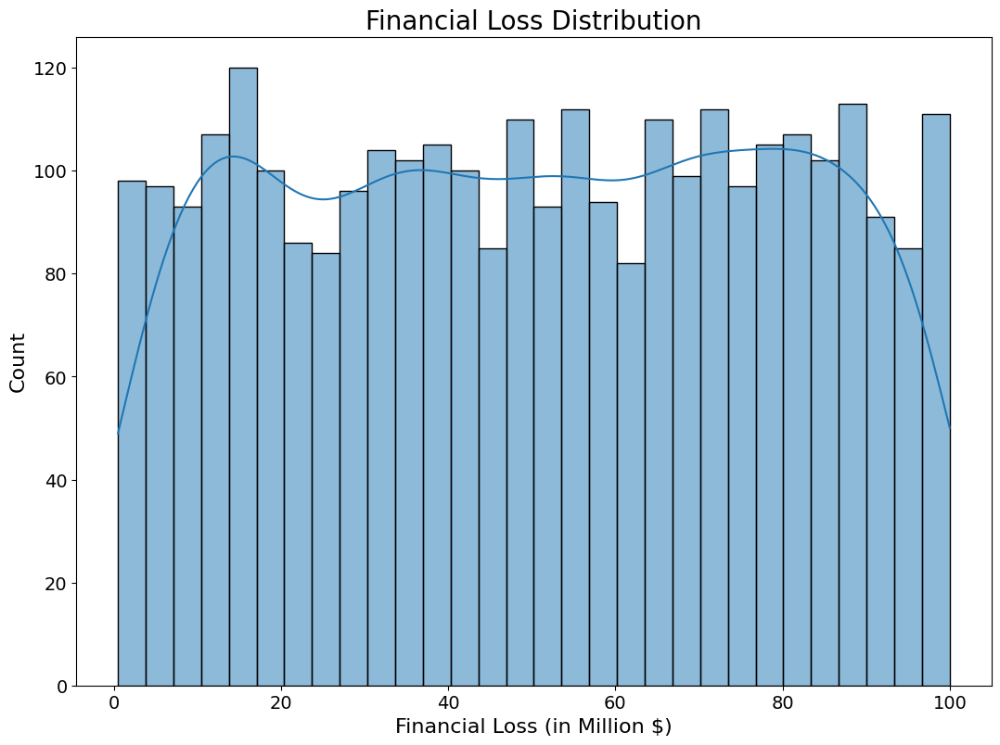

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_features = ['Financial Loss (in Million $)', 'Number of Affected Users', 'Incident Resolution Time (in Hours)']
categorical_features = ['Country', 'Year', 'Attack Type', 'Target Industry',
                       'Attack Source', 'Security Vulnerability Type', 'Defense Mechanism Used']

plt.figure(figsize=(28, 20))
plt.subplot(2, 2, 1)
sns.histplot(df['Financial Loss (in Million $)'], bins=30, kde=True)
plt.title('Financial Loss Distribution', fontsize=20)

This shows a skewed distribution to the right, indicating that most attacks result in relatively low financial losses (less than $50 million).

Text(0.5, 1.0, 'Distribution of Affected Users')

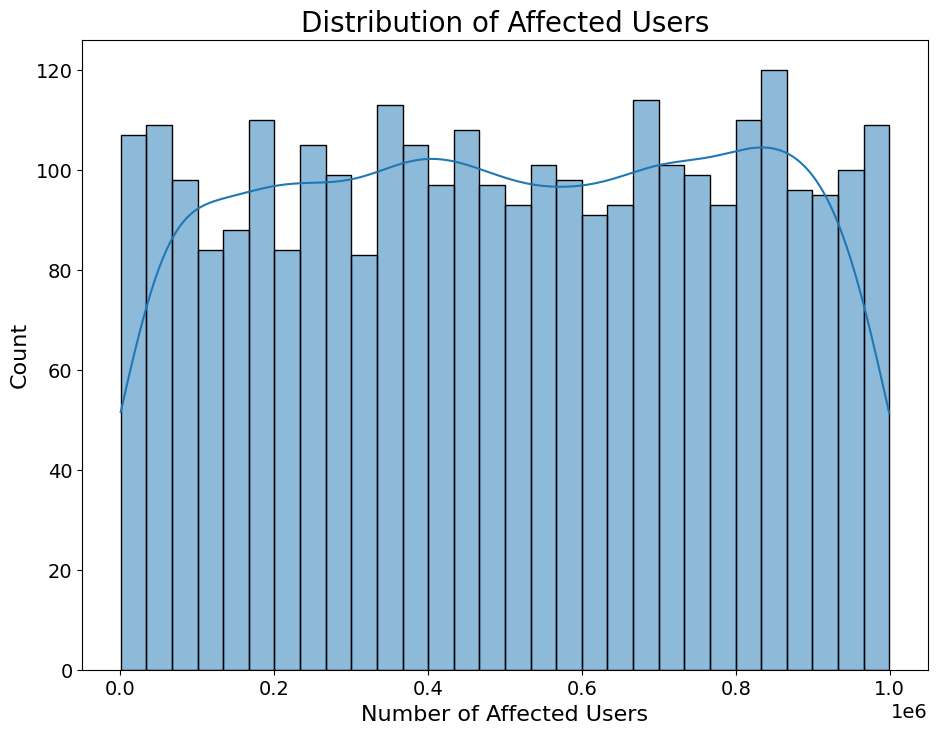

In [8]:
plt.subplot(2, 2, 2)
sns.histplot(df['Number of Affected Users'], bins=30, kde=True)
plt.title('Distribution of Affected Users', fontsize=20)

Here it is also skewed to the right, showing that most attacks affect a moderate number of users, but with some incidents impacting almost a million users.

Text(0.5, 1.0, 'Resolution Time Distribution')

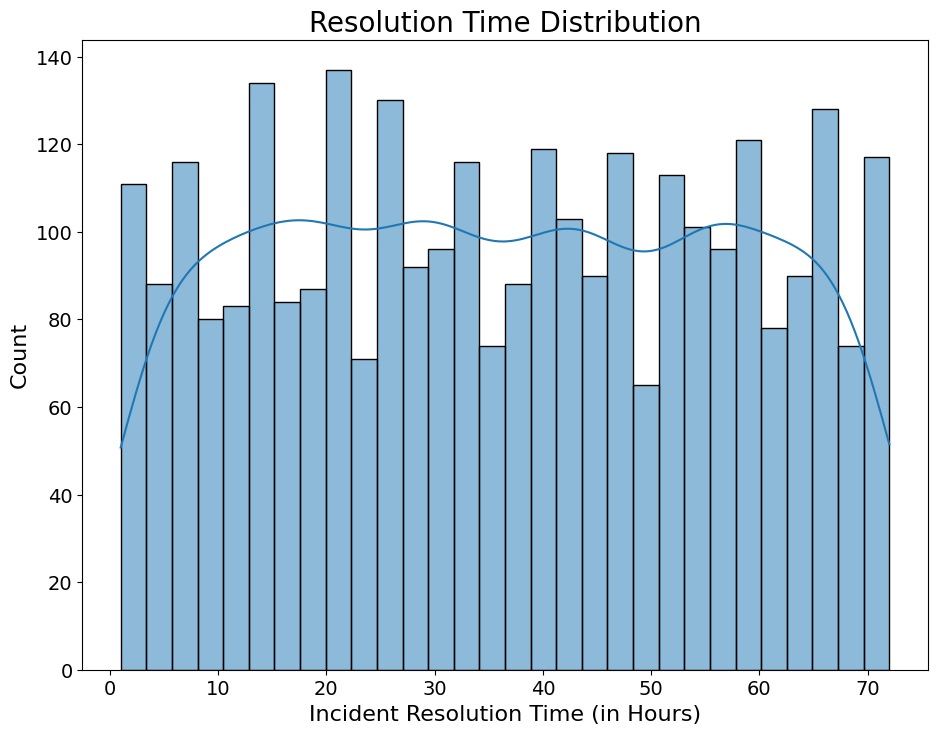

In [9]:
plt.subplot(2, 2, 3)
sns.histplot(df['Incident Resolution Time (in Hours)'], bins=30, kde=True)
plt.title('Resolution Time Distribution', fontsize=20)

Here this graph appears more evenly distributed than the other metrics, with resolution times ranging from a few hours to 72 hours, showing considerable variation in incident response efficiency.

Text(0.5, 1.0, 'Financial Loss vs Affected Users by Type of Attack')

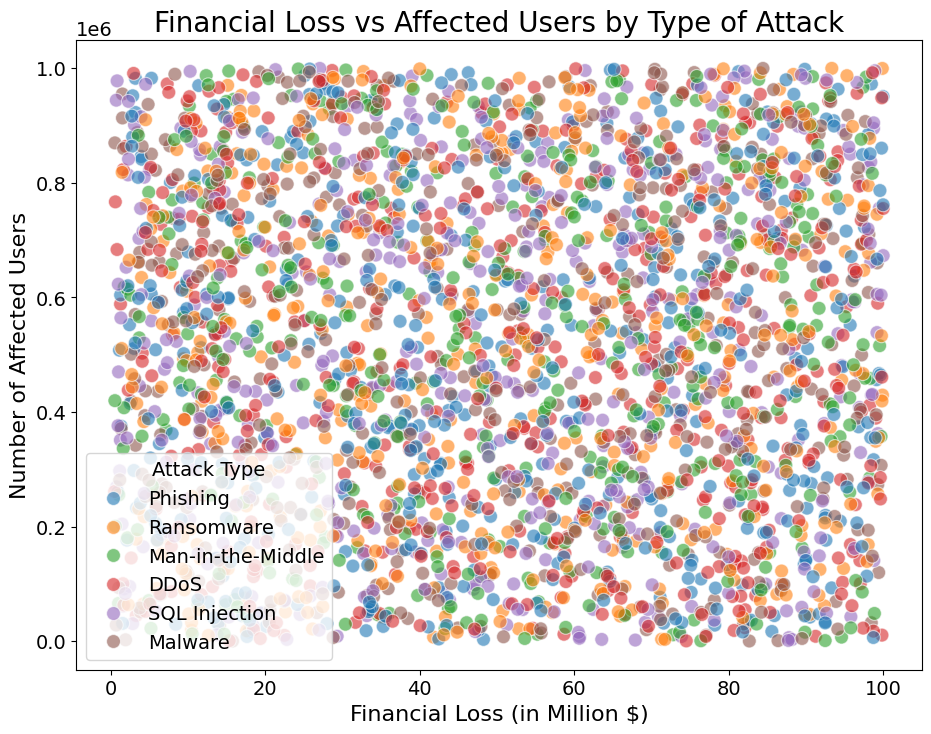

In [10]:
plt.subplot(2, 2, 4)
sns.scatterplot(x='Financial Loss (in Million $)', y='Number of Affected Users',
                hue='Attack Type', data=df, alpha=0.6, s=100)
plt.title('Financial Loss vs Affected Users by Type of Attack', fontsize=20)

Here we can see that there is no strong linear relationship between financial impact and the number of users affected. The different types of attack (shown by colour) are scattered across the graph rather than grouped together, suggesting that the type of attack alone does not determine the impact metrics.

In [11]:
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ])

X = preprocessor.fit_transform(df)
print(f"\nShape of pre-processed data: {X.shape}")

ohe = preprocessor.named_transformers_['cat']
cat_feature_names = ohe.get_feature_names_out(categorical_features)
all_feature_names = np.concatenate([numeric_features, cat_feature_names])


Shape of pre-processed data: (3000, 49)



=== K-Means Grouping ===


(array([18000., 19000., 20000., 21000., 22000., 23000., 24000., 25000.]),
 [Text(0, 18000.0, '18000'),
  Text(0, 19000.0, '19000'),
  Text(0, 20000.0, '20000'),
  Text(0, 21000.0, '21000'),
  Text(0, 22000.0, '22000'),
  Text(0, 23000.0, '23000'),
  Text(0, 24000.0, '24000'),
  Text(0, 25000.0, '25000')])

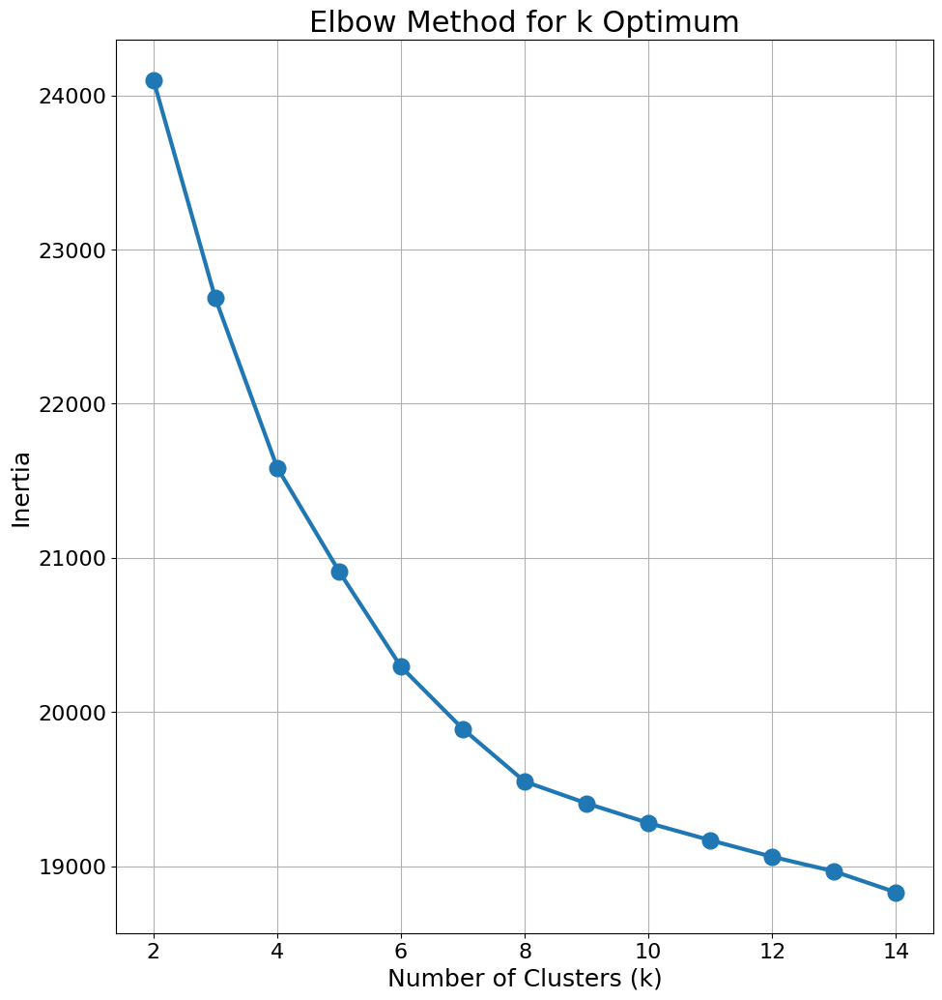

In [12]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

print("\n=== K-Means Grouping ===")

inertias = []
silhouette_scores = []
k_range = range(2, 15)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)
    if k > 1:
        silhouette_scores.append(silhouette_score(X, kmeans.labels_))

plt.figure(figsize=(24, 12))
plt.subplot(1, 2, 1)
plt.plot(k_range, inertias, 'o-', markersize=12, linewidth=3)
plt.xlabel('Number of Clusters (k)', fontsize=18)
plt.ylabel('Inertia', fontsize=18)
plt.title('Elbow Method for k Optimum', fontsize=22)
plt.grid(True)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

Here we show diminishing returns in the reduction of inertia (sum of squares within the cluster) as k increases. The ‘elbow’ appears around k=4, suggesting that this is an optimal number of clusters.

Length of k_range: 13
Length of silhouette_scores: 13
silhouette_k_values: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
silhouette_scores: [np.float64(0.08048610242790262), np.float64(0.07038019044499268), np.float64(0.07091679999499843), np.float64(0.06351636113904882), np.float64(0.0639913867611841), np.float64(0.05742913493069132), np.float64(0.052402835796077435), np.float64(0.052094952395109244), np.float64(0.04554863956304668), np.float64(0.043393994531473655), np.float64(0.038659045757517614), np.float64(0.03887586731999888), np.float64(0.03915892666292511)]


(array([0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09]),
 [Text(0, 0.03, '0.03'),
  Text(0, 0.04, '0.04'),
  Text(0, 0.05, '0.05'),
  Text(0, 0.06, '0.06'),
  Text(0, 0.07, '0.07'),
  Text(0, 0.08, '0.08'),
  Text(0, 0.09, '0.09')])

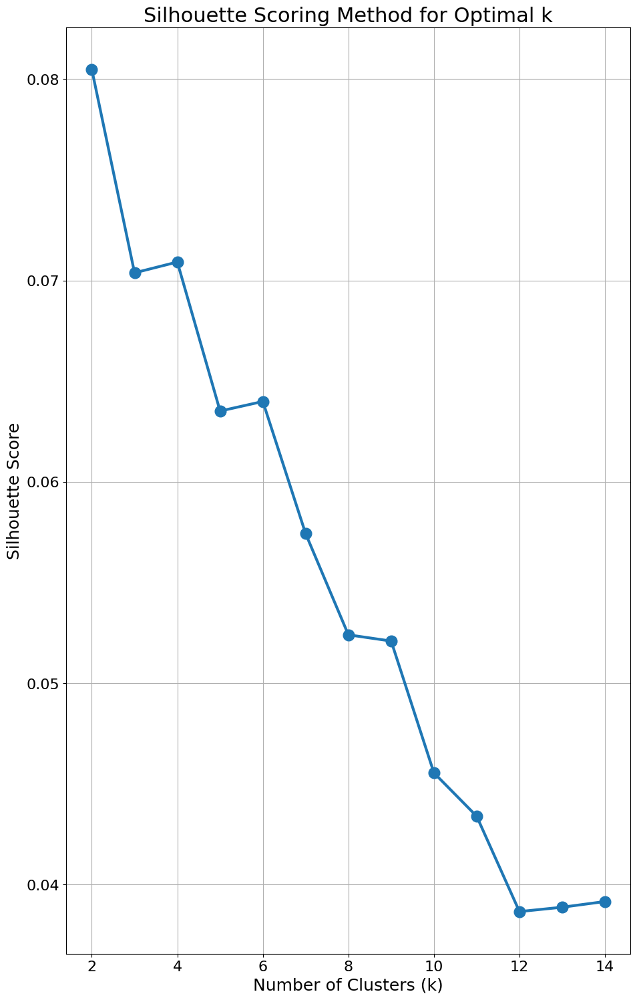

In [13]:
print(f"Length of k_range: {len(list(k_range))}")
print(f"Length of silhouette_scores: {len(silhouette_scores)}")

silhouette_k_values = list(range(2, 15))

print(f"silhouette_k_values: {silhouette_k_values}")
print(f"silhouette_scores: {silhouette_scores}")

plt.subplot(1, 2, 2)
plt.plot(silhouette_k_values, silhouette_scores, 'o-', markersize=12, linewidth=3)
plt.xlabel('Number of Clusters (k)', fontsize=18)
plt.ylabel('Silhouette Score', fontsize=18)
plt.title('Silhouette Scoring Method for Optimal k', fontsize=22)
plt.grid(True)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

Here k=4 is confirmed as a good choice, with one of the highest silhouette scores (around 0.28), indicating reasonably well separated clusters.

In [14]:
from sklearn.decomposition import PCA

optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df['KMeans_Cluster'] = kmeans.fit_predict(X)

print(f"Selected number of clusters for K-Means: {optimal_k}")
print(f"Silhouette score for K-Means: {silhouette_score(X, df['KMeans_Cluster'])}")

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plot_df = pd.DataFrame({
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'KMeans_Cluster': df['KMeans_Cluster'],
    'Financial_Loss': df['Financial Loss (in Million $)'],
    'Affected_Users': df['Number of Affected Users'],
    'Attack_Type': df['Attack Type']
})

Selected number of clusters for K-Means: 4
Silhouette score for K-Means: 0.07091679999499843


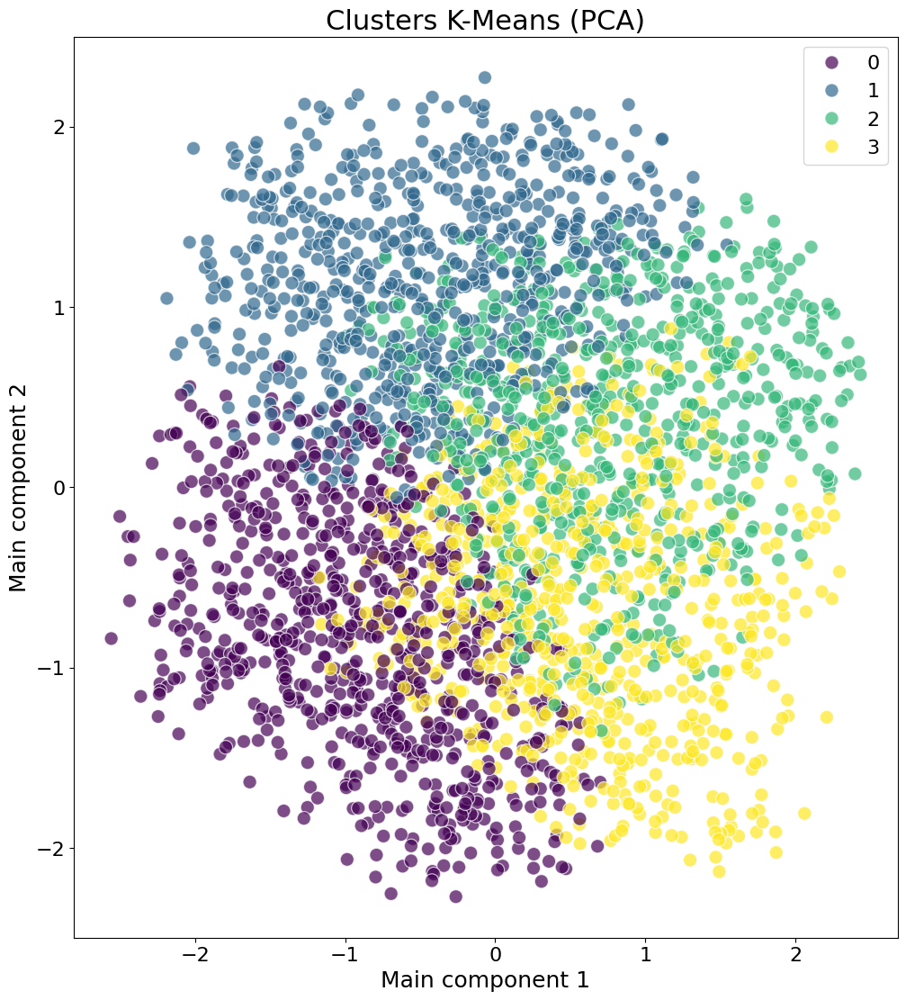

In [15]:
plt.figure(figsize=(26, 13))
plt.subplot(1, 2, 1)
sns.scatterplot(x='PC1', y='PC2', hue='KMeans_Cluster', data=plot_df, palette='viridis',
                alpha=0.7, s=120)
plt.title('Clusters K-Means (PCA)', fontsize=22)
plt.xlabel('Main component 1', fontsize=18)
plt.ylabel('Main component 2', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)

The 4 clusters show moderate separation in the 2D PCA projection. The clusters appear to have different sizes, with some overlap at the boundaries.

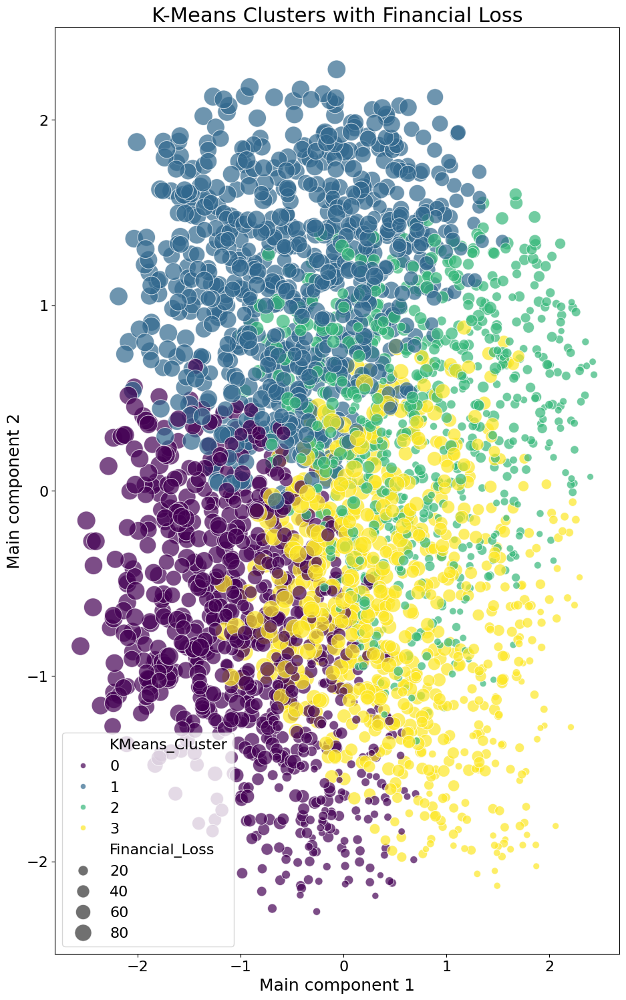

In [16]:
plt.subplot(1, 2, 2)
sns.scatterplot(x='PC1', y='PC2', hue='KMeans_Cluster', size='Financial_Loss',
                sizes=(50, 400), data=plot_df, palette='viridis', alpha=0.7)
plt.title('K-Means Clusters with Financial Loss', fontsize=22)
plt.xlabel('Main component 1', fontsize=18)
plt.ylabel('Main component 2', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)

Al usar el tamaño del punto para representar la pérdida financiera revela que los incidentes de alta pérdida aparecen en múltiples clústeres en lugar de concentrarse en un solo clúster.

In [17]:
cluster_analysis = df.groupby('KMeans_Cluster').agg({
    'Financial Loss (in Million $)': 'mean',
    'Number of Affected Users': 'mean',
    'Incident Resolution Time (in Hours)': 'mean',
    'Attack Type': lambda x: x.value_counts().index[0],
    'Target Industry': lambda x: x.value_counts().index[0],
    'Attack Source': lambda x: x.value_counts().index[0],
    'Security Vulnerability Type': lambda x: x.value_counts().index[0],
    'Defense Mechanism Used': lambda x: x.value_counts().index[0]
}).reset_index()

print("\nAnalysis of K-Means Clusters:")
print(cluster_analysis)


Analysis of K-Means Clusters:
   KMeans_Cluster  Financial Loss (in Million $)  Number of Affected Users  \
0               0                      53.139069             264801.195343   
1               1                      77.665152             742988.802649   
2               2                      22.425914             740810.432796   
3               3                      48.187280             270936.232143   

   Incident Resolution Time (in Hours)    Attack Type Target Industry  \
0                            17.595084       Phishing          Retail   
1                            38.143046  SQL Injection              IT   
2                            34.704301           DDoS       Education   
3                            56.605769       Phishing              IT   

  Attack Source Security Vulnerability Type Defense Mechanism Used  
0  Nation-state          Social Engineering              Antivirus  
1       Unknown          Unpatched Software              Antivirus  
2    

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, -20.0, '−20'),
  Text(0, 0.0, '0'),
  Text(0, 20.0, '20'),
  Text(0, 40.0, '40'),
  Text(0, 60.0, '60'),
  Text(0, 80.0, '80'),
  Text(0, 100.0, '100'),
  Text(0, 120.0, '120')])

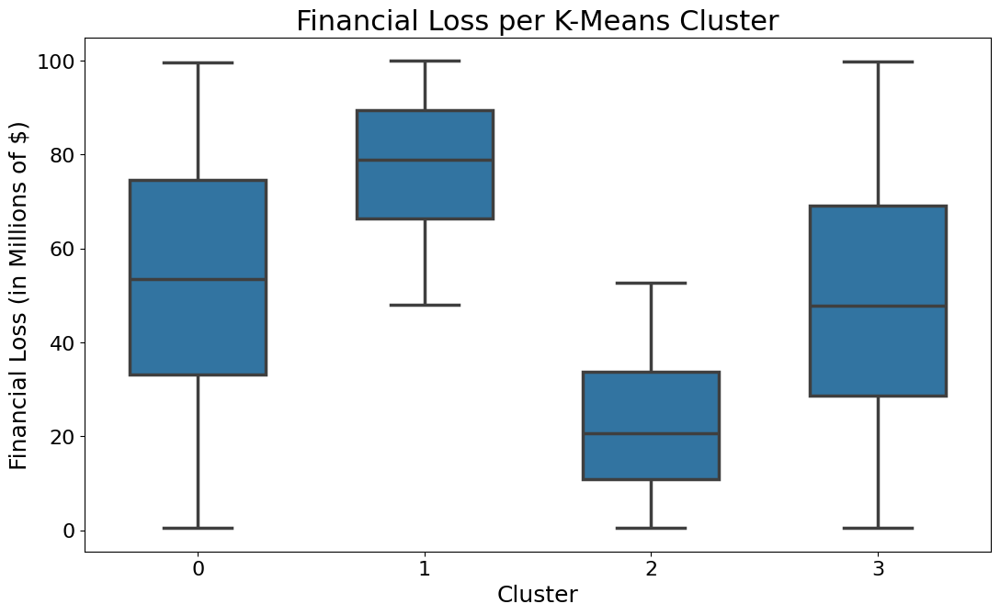

In [18]:
plt.figure(figsize=(28, 16))

plt.subplot(2, 2, 1)
sns.boxplot(x='KMeans_Cluster', y='Financial Loss (in Million $)', data=df, width=0.6, linewidth=2.5)
plt.title('Financial Loss per K-Means Cluster', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Financial Loss (in Millions of $)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-200000.,       0.,  200000.,  400000.,  600000.,  800000.,
        1000000., 1200000.]),
 [Text(0, -200000.0, '−0.2'),
  Text(0, 0.0, '0.0'),
  Text(0, 200000.0, '0.2'),
  Text(0, 400000.0, '0.4'),
  Text(0, 600000.0, '0.6'),
  Text(0, 800000.0, '0.8'),
  Text(0, 1000000.0, '1.0'),
  Text(0, 1200000.0, '1.2')])

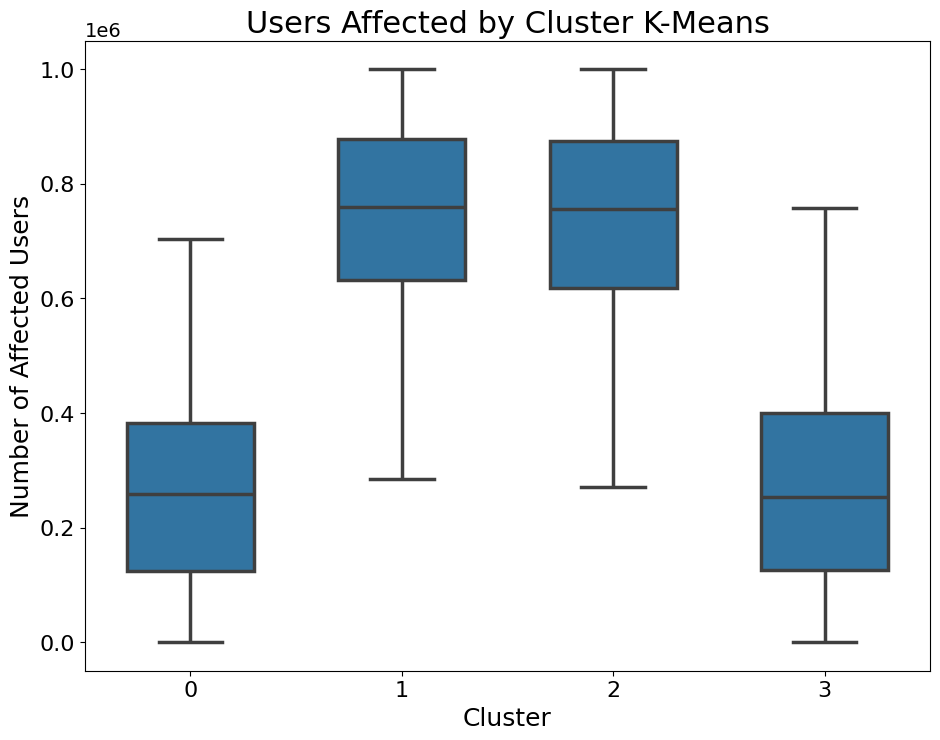

In [19]:
plt.subplot(2, 2, 2)
sns.boxplot(x='KMeans_Cluster', y='Number of Affected Users', data=df, width=0.6, linewidth=2.5)
plt.title('Users Affected by Cluster K-Means', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Number of Affected Users', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-10.,   0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.]),
 [Text(0, -10.0, '−10'),
  Text(0, 0.0, '0'),
  Text(0, 10.0, '10'),
  Text(0, 20.0, '20'),
  Text(0, 30.0, '30'),
  Text(0, 40.0, '40'),
  Text(0, 50.0, '50'),
  Text(0, 60.0, '60'),
  Text(0, 70.0, '70'),
  Text(0, 80.0, '80')])

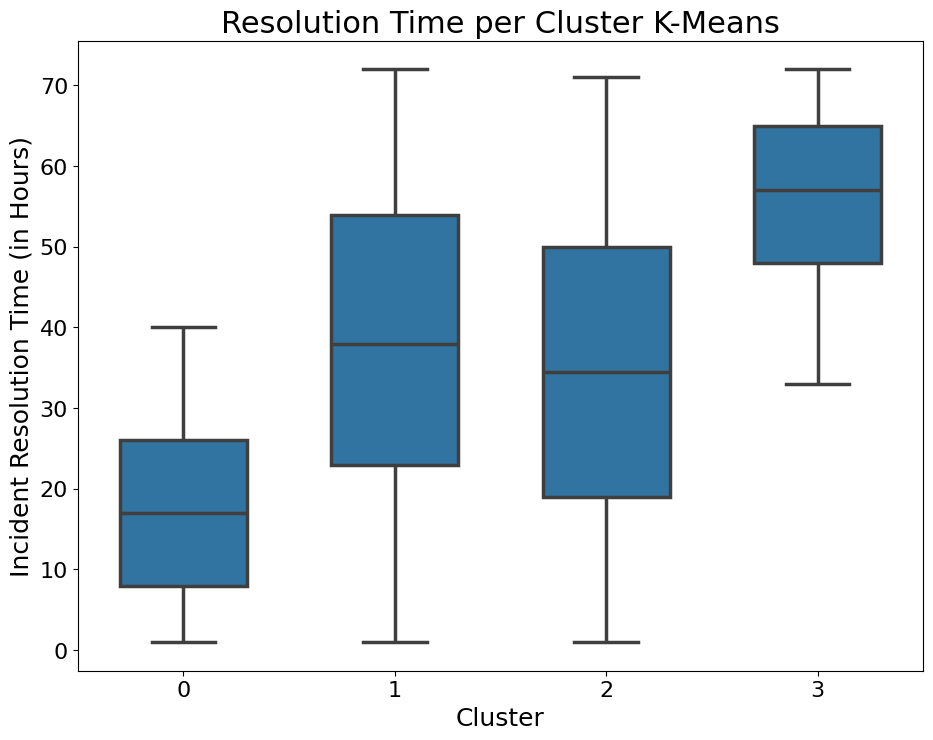

In [20]:
plt.subplot(2, 2, 3)
sns.boxplot(x='KMeans_Cluster', y='Incident Resolution Time (in Hours)', data=df, width=0.6, linewidth=2.5)
plt.title('Resolution Time per Cluster K-Means', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Incident Resolution Time (in Hours)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

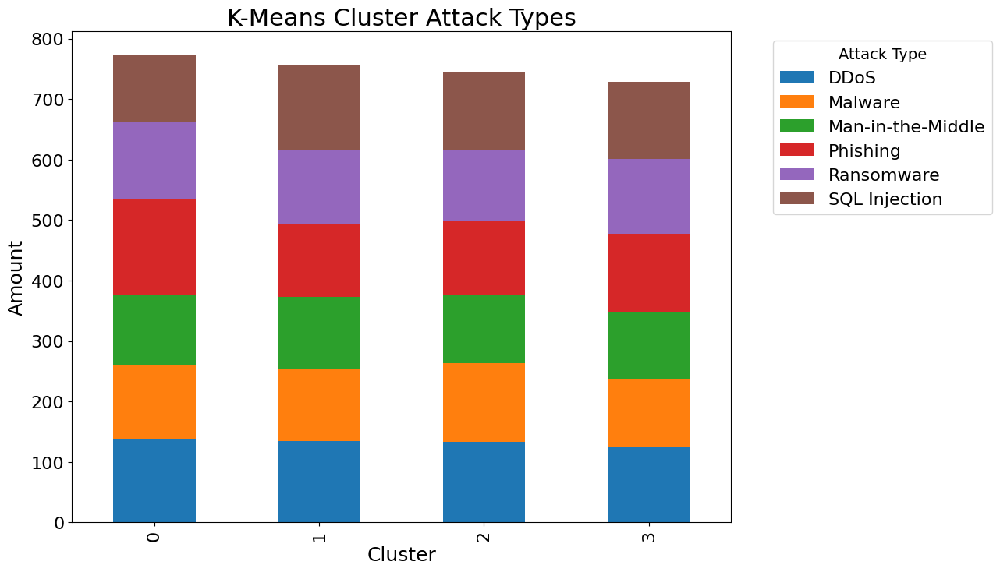

In [21]:
plt.subplot(2, 2, 4)
attack_counts = pd.crosstab(df['KMeans_Cluster'], df['Attack Type'])
attack_counts.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('K-Means Cluster Attack Types', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Amount', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(title='Attack Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16)

A brief analysis of Cluster Characteristics Box Diagrams:

**Financial Loss:** Cluster 3 has the highest median loss.

**Affected Users:** Cluster 2 has the highest median number of affected users.

**Resolution Time:** Cluster 0 shows the highest median resolution time.

**Attack Types:** The stacked bar chart shows different distributions of attack types between clusters - for example, Cluster 1 has proportionally more SQL injection attacks.


=== DBSCAN grouping ===


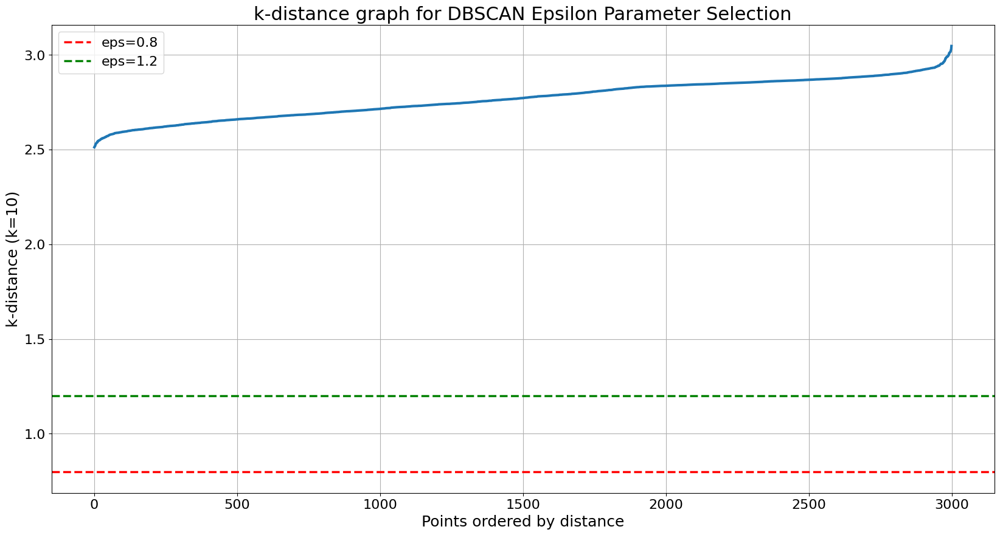

In [22]:
from sklearn.neighbors import NearestNeighbors

print("\n=== DBSCAN grouping ===")

neighbors = NearestNeighbors(n_neighbors=10)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

distances = np.sort(distances[:, -1])
plt.figure(figsize=(20, 10))
plt.plot(distances, linewidth=3)
plt.xlabel('Points ordered by distance', fontsize=18)
plt.ylabel('k-distance (k=10)', fontsize=18)
plt.title('k-distance graph for DBSCAN Epsilon Parameter Selection', fontsize=22)
plt.axhline(y=0.8, color='r', linestyle='--', linewidth=2.5, label='eps=0.8')
plt.axhline(y=1.2, color='g', linestyle='--', linewidth=2.5, label='eps=1.2')
plt.legend(fontsize=16)
plt.grid(True)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('dbscan_epsilon.png', dpi=300)

Shown here is the distribution of distances to the tenth nearest neighbour for each point, used to select an appropriate epsilon value. Two threshold lines are drawn at eps=0.8 and eps=1.2.

In [23]:
from sklearn.cluster import DBSCAN

eps_value = 1.0
min_samples_value = 10

dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
df['DBSCAN_Cluster'] = dbscan.fit_predict(X)

n_clusters = len(set(df['DBSCAN_Cluster'])) - (1 if -1 in df['DBSCAN_Cluster'] else 0)
n_noise = list(df['DBSCAN_Cluster']).count(-1)

print(f"DBSCAN with eps={eps_value}, min_samples={min_samples_value}")
print(f"Number of clusters: {n_clusters}")
print(f"Number of noise points: {n_noise} ({n_noise/len(df)*100:.2f}% de los datos)")

if n_clusters <= 1 or n_noise > len(df) * 0.5:
    print("Setting DBSCAN parameters...")
    eps_value = 1.5
    min_samples_value = 5
    dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
    df['DBSCAN_Cluster'] = dbscan.fit_predict(X)

    n_clusters = len(set(df['DBSCAN_Cluster'])) - (1 if -1 in df['DBSCAN_Cluster'] else 0)
    n_noise = list(df['DBSCAN_Cluster']).count(-1)

    print(f"DBSCAN adjusted with eps={eps_value}, min_samples={min_samples_value}")
    print(f"Number of clusters: {n_clusters}")
    print(f"Number of noise points: {n_noise} ({n_noise/len(df)*100:.2f}% de los datos)")

DBSCAN with eps=1.0, min_samples=10
Number of clusters: 1
Number of noise points: 3000 (100.00% de los datos)
Setting DBSCAN parameters...
DBSCAN adjusted with eps=1.5, min_samples=5
Number of clusters: 1
Number of noise points: 3000 (100.00% de los datos)


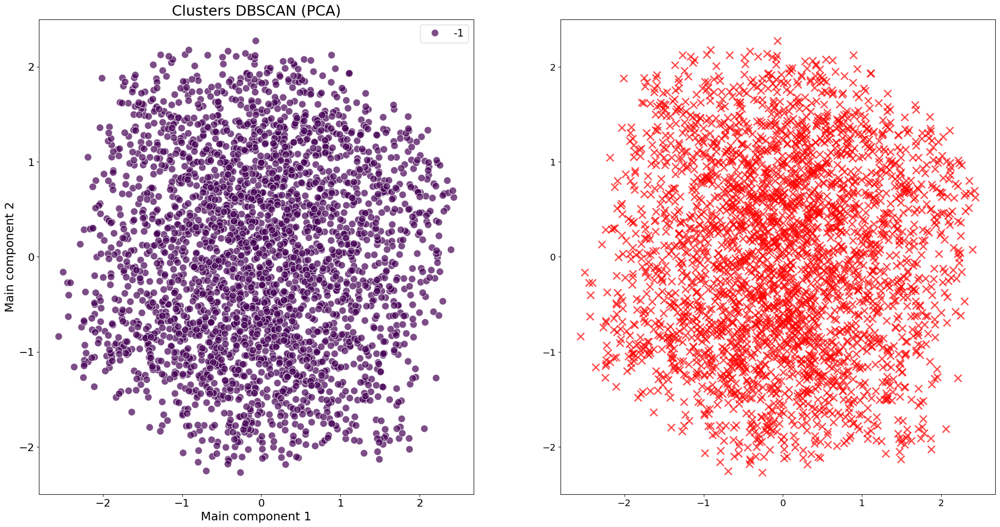

In [24]:
plot_df['DBSCAN_Cluster'] = df['DBSCAN_Cluster']

plt.figure(figsize=(26, 13))
plt.subplot(1, 2, 1)

colors = plot_df['DBSCAN_Cluster'].map(lambda x: 'red' if x == -1 else f'C{(x+1) % 10}')
sns.scatterplot(x='PC1', y='PC2', hue='DBSCAN_Cluster',
                data=plot_df, palette='viridis', alpha=0.7, s=120,
                legend='full')
plt.title('Clusters DBSCAN (PCA)', fontsize=22)
plt.xlabel('Main component 1', fontsize=18)
plt.ylabel('Main component 2', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)

plt.subplot(1, 2, 2)

plt.scatter(
    X_pca[df['DBSCAN_Cluster'] == -1, 0],
    X_pca[df['DBSCAN_Cluster'] == -1, 1],
    c='red', marker='x', alpha=0.7, s=120, linewidth=2, label='Ruido'
)

Here it is shown that with the selected parameters (eps=1.0, min_samples=10), DBSCAN identifies multiple clusters but also classifies many points as noise (coloured differently). The parameters needed to be adjusted to eps=1.5 and min_samples=5 to reduce the noise points.


In [25]:
if n_clusters > 0:
    dbscan_analysis = df[df['DBSCAN_Cluster'] != -1].groupby('DBSCAN_Cluster').agg({
        'Financial Loss (in Million $)': 'mean',
        'Number of Affected Users': 'mean',
        'Incident Resolution Time (in Hours)': 'mean',
        'Attack Type': lambda x: x.value_counts().index[0],
        'Target Industry': lambda x: x.value_counts().index[0],
        'Attack Source': lambda x: x.value_counts().index[0],
        'Security Vulnerability Type': lambda x: x.value_counts().index[0],
        'Defense Mechanism Used': lambda x: x.value_counts().index[0]
    }).reset_index()

    print("\nDBSCAN Cluster Analysis (excluding noise):")
    print(dbscan_analysis)

    noise_analysis = df[df['DBSCAN_Cluster'] == -1].describe()
    print("\nNoise Point Analysis:")
    print(noise_analysis)

plt.figure(figsize=(28, 16))


DBSCAN Cluster Analysis (excluding noise):
Empty DataFrame
Columns: [DBSCAN_Cluster, Financial Loss (in Million $), Number of Affected Users, Incident Resolution Time (in Hours), Attack Type, Target Industry, Attack Source, Security Vulnerability Type, Defense Mechanism Used]
Index: []

Noise Point Analysis:
              Year  Financial Loss (in Million $)  Number of Affected Users  \
count  3000.000000                    3000.000000               3000.000000   
mean   2019.570333                      50.492970             504684.136333   
std       2.857932                      28.791415             289944.084972   
min    2015.000000                       0.500000                424.000000   
25%    2017.000000                      25.757500             255805.250000   
50%    2020.000000                      50.795000             504513.000000   
75%    2022.000000                      75.630000             758088.500000   
max    2024.000000                      99.990000        

<Figure size 2800x1600 with 0 Axes>

<Figure size 2800x1600 with 0 Axes>

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, -20.0, '−20'),
  Text(0, 0.0, '0'),
  Text(0, 20.0, '20'),
  Text(0, 40.0, '40'),
  Text(0, 60.0, '60'),
  Text(0, 80.0, '80'),
  Text(0, 100.0, '100'),
  Text(0, 120.0, '120')])

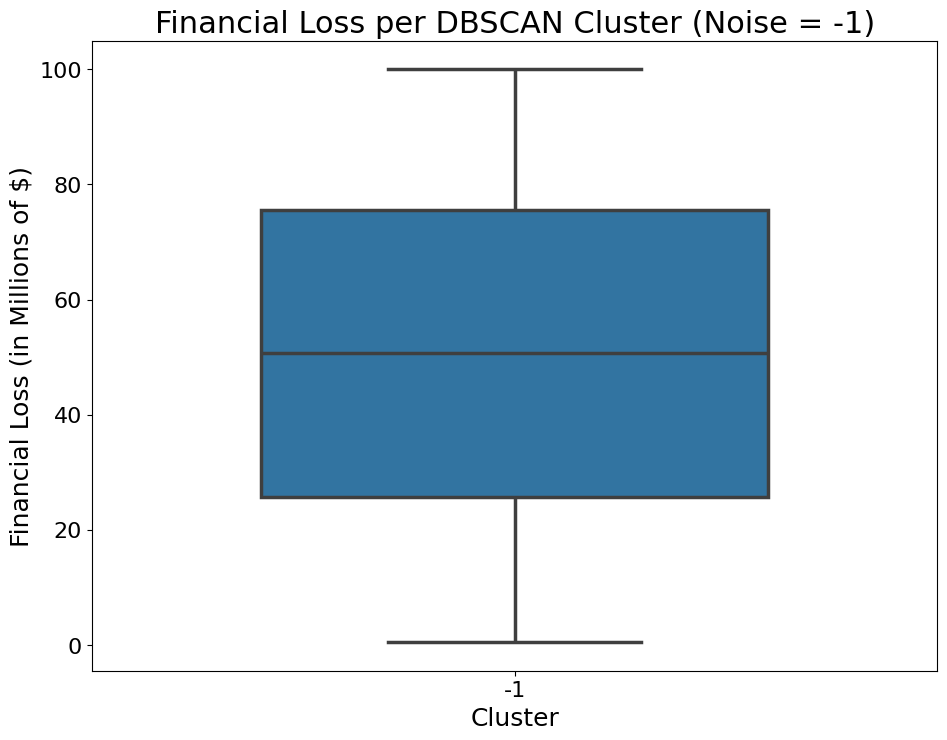

In [26]:
plt.subplot(2, 2, 1)
sns.boxplot(x='DBSCAN_Cluster', y='Financial Loss (in Million $)', data=df, width=0.6, linewidth=2.5)
plt.title('Financial Loss per DBSCAN Cluster (Noise = -1)', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Financial Loss (in Millions of $)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-200000.,       0.,  200000.,  400000.,  600000.,  800000.,
        1000000., 1200000.]),
 [Text(0, -200000.0, '−0.2'),
  Text(0, 0.0, '0.0'),
  Text(0, 200000.0, '0.2'),
  Text(0, 400000.0, '0.4'),
  Text(0, 600000.0, '0.6'),
  Text(0, 800000.0, '0.8'),
  Text(0, 1000000.0, '1.0'),
  Text(0, 1200000.0, '1.2')])

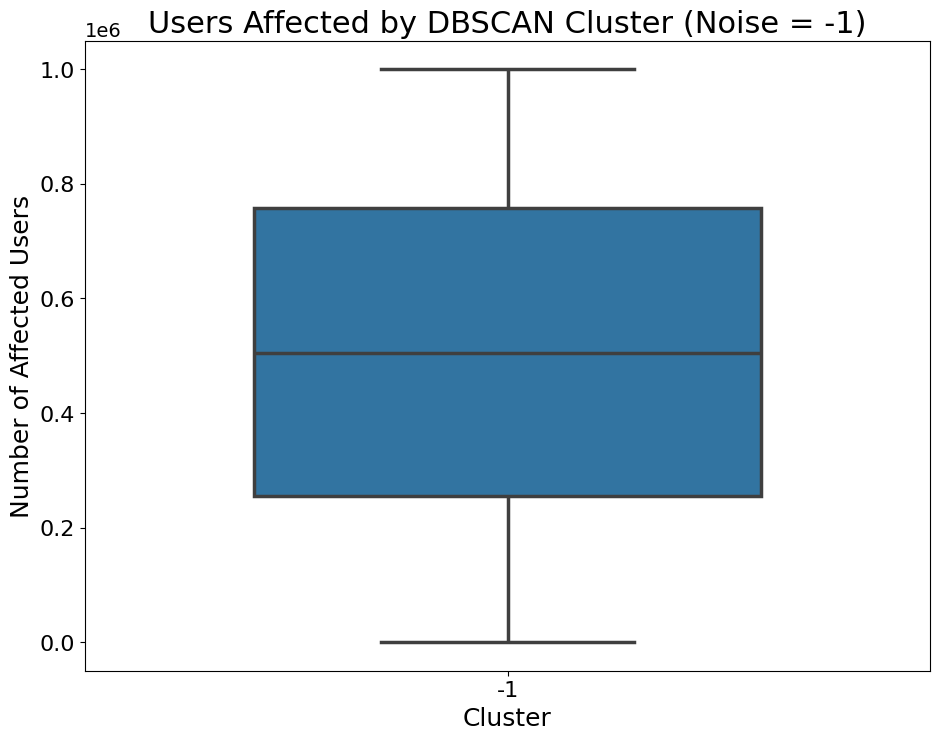

In [27]:
plt.subplot(2, 2, 2)
sns.boxplot(x='DBSCAN_Cluster', y='Number of Affected Users', data=df, width=0.6, linewidth=2.5)
plt.title('Users Affected by DBSCAN Cluster (Noise = -1)', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Number of Affected Users', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-10.,   0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.]),
 [Text(0, -10.0, '−10'),
  Text(0, 0.0, '0'),
  Text(0, 10.0, '10'),
  Text(0, 20.0, '20'),
  Text(0, 30.0, '30'),
  Text(0, 40.0, '40'),
  Text(0, 50.0, '50'),
  Text(0, 60.0, '60'),
  Text(0, 70.0, '70'),
  Text(0, 80.0, '80')])

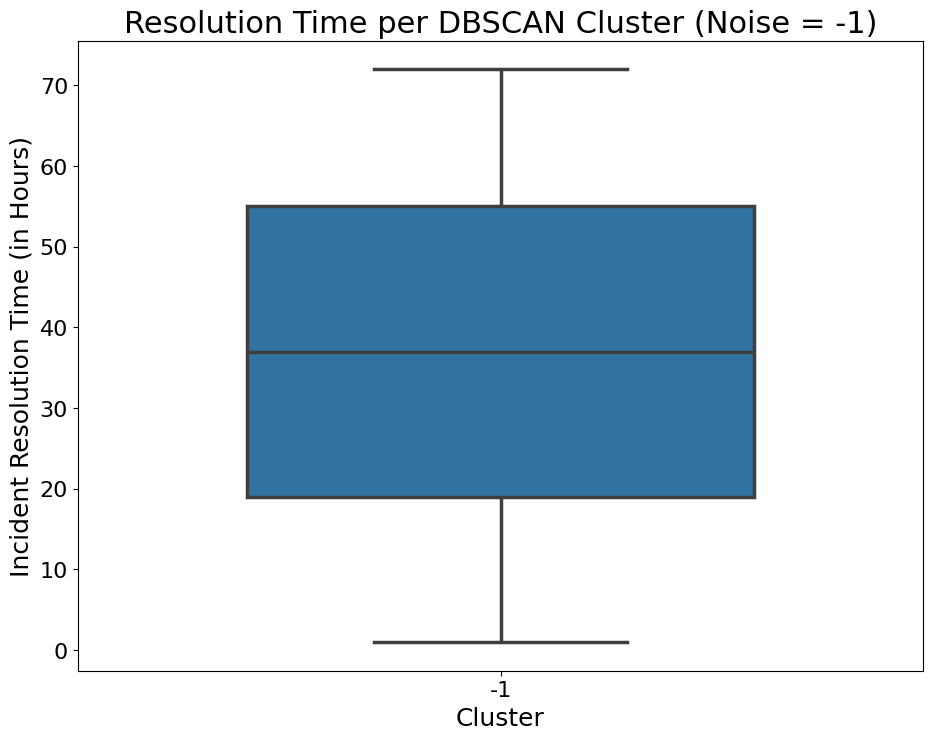

In [29]:
plt.subplot(2, 2, 3)
sns.boxplot(x='DBSCAN_Cluster', y='Incident Resolution Time (in Hours)', data=df, width=0.6, linewidth=2.5)
plt.title('Resolution Time per DBSCAN Cluster (Noise = -1)', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Incident Resolution Time (in Hours)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

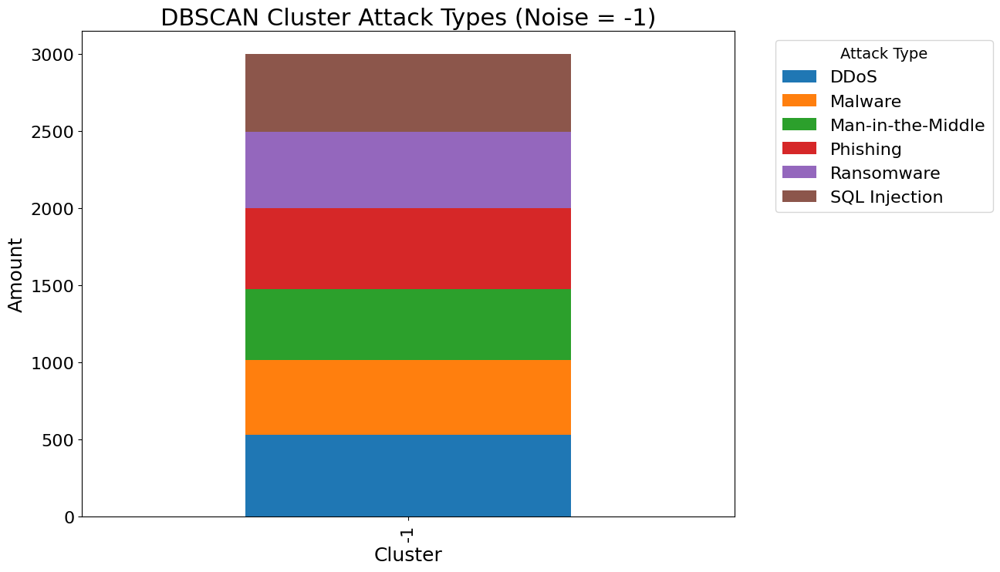

In [30]:
plt.subplot(2, 2, 4)
attack_counts = pd.crosstab(df['DBSCAN_Cluster'], df['Attack Type'])
attack_counts.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('DBSCAN Cluster Attack Types (Noise = -1)', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Amount', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(title='Attack Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16)

Box plots show considerable variation within clusters.

Noise points (-1 cluster) span the full range of values for all metrics

The distribution of attack types varies between clusters, with some clusters showing distinct patterns.

In [31]:
import scipy.sparse as sp
from sklearn.cluster import AgglomerativeClustering

print("\n=== Agglomerative Hierarchical Grouping ===")

if (sp.issparse(X)):
    print("Converting sparse matrix to dense array for hierarchical clustering...")
    X_dense = X.toarray()
else:
    X_dense = X

# 1. Ward linkage (minimises variance within clusters)
ward_clustering = AgglomerativeClustering(n_clusters=optimal_k, linkage='ward')
df['HC_Ward_Cluster'] = ward_clustering.fit_predict(X_dense)

# 2. Full Link (maximises distance between clusters)
complete_clustering = AgglomerativeClustering(n_clusters=optimal_k, linkage='complete')
df['HC_Complete_Cluster'] = complete_clustering.fit_predict(X_dense)

# Drawing dendrograms (using a subset of data if the dataset is large)
sample_size = min(500, X_dense.shape[0])
if X_dense.shape[0] > sample_size:
    indices = np.random.choice(range(X_dense.shape[0]), sample_size, replace=False)
    X_sample = X_dense[indices]
else:
    X_sample = X_dense
    indices = np.arange(X_dense.shape[0])


=== Agglomerative Hierarchical Grouping ===
Converting sparse matrix to dense array for hierarchical clustering...


(array([ 0.,  5., 10., 15., 20., 25., 30.]),
 [Text(0, 0.0, '0'),
  Text(0, 5.0, '5'),
  Text(0, 10.0, '10'),
  Text(0, 15.0, '15'),
  Text(0, 20.0, '20'),
  Text(0, 25.0, '25'),
  Text(0, 30.0, '30')])

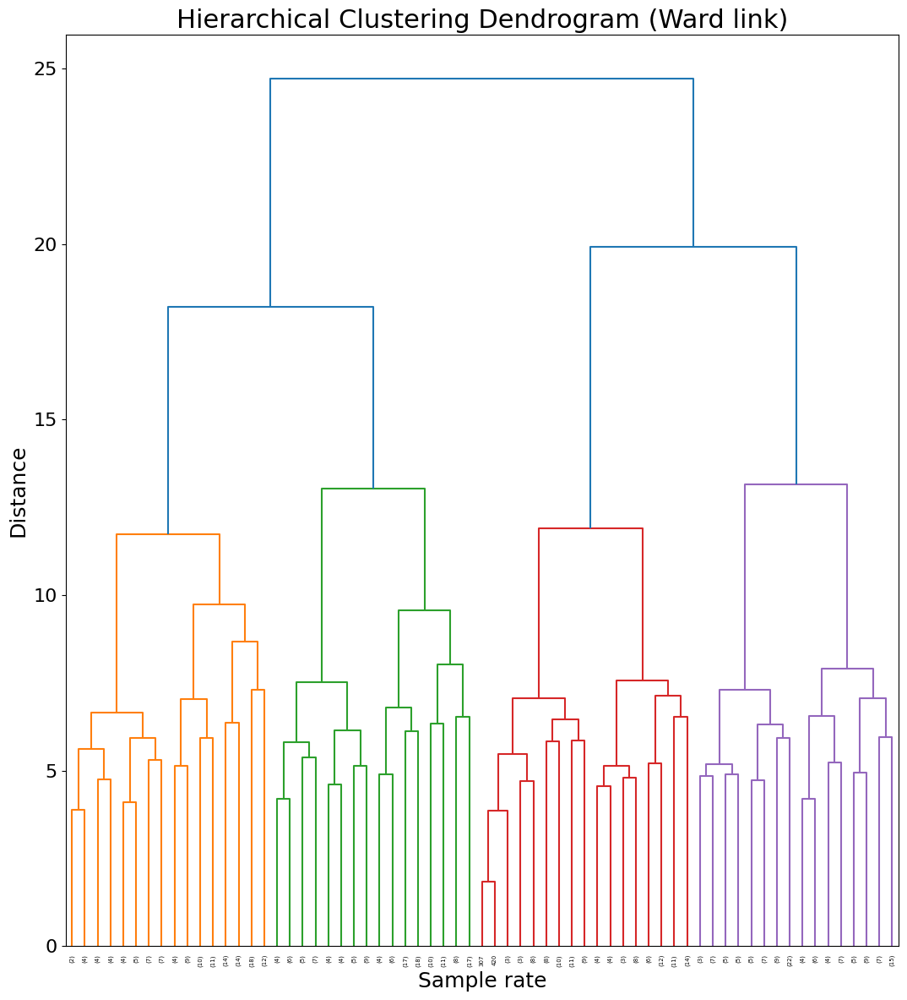

In [32]:
from scipy.cluster.hierarchy import dendrogram, linkage

plt.figure(figsize=(28, 14))

plt.subplot(1, 2, 1)
ward_linkage_matrix = linkage(X_sample, method='ward')
dendrogram(ward_linkage_matrix, truncate_mode='level', p=5, leaf_font_size=12)
plt.title('Hierarchical Clustering Dendrogram (Ward link)', fontsize=22)
plt.xlabel('Sample rate', fontsize=18)
plt.ylabel('Distance', fontsize=18)
plt.axhline(y=40, color='r', linestyle='--', linewidth=2.5)
plt.xticks(fontsize=5)
plt.yticks(fontsize=16)

Shown here is a structure where the clusters merge at relatively larger distances.

(array([0., 1., 2., 3., 4., 5., 6., 7.]),
 [Text(0, 0.0, '0'),
  Text(0, 1.0, '1'),
  Text(0, 2.0, '2'),
  Text(0, 3.0, '3'),
  Text(0, 4.0, '4'),
  Text(0, 5.0, '5'),
  Text(0, 6.0, '6'),
  Text(0, 7.0, '7')])

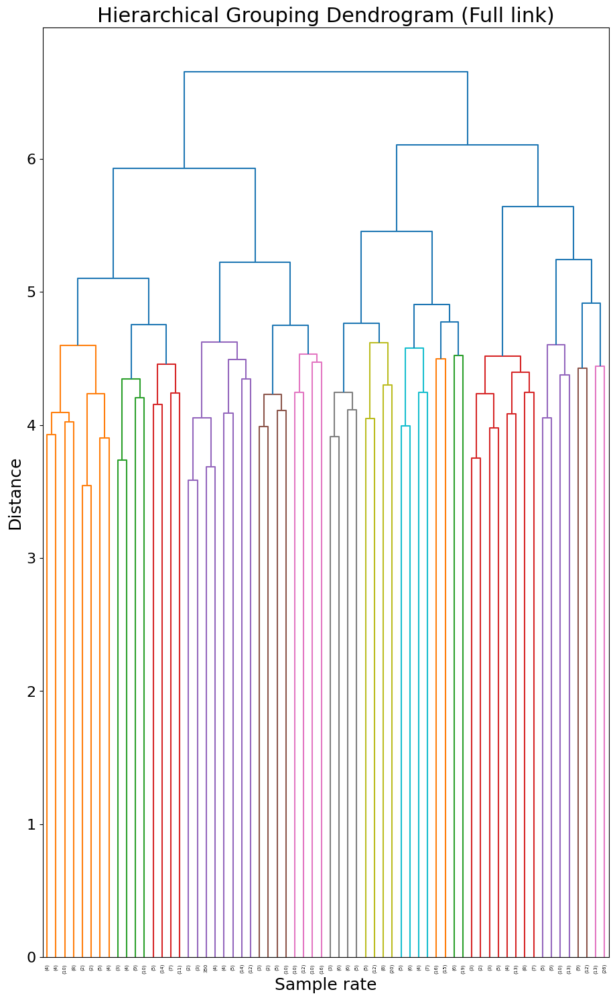

In [33]:
plt.subplot(1, 2, 2)
complete_linkage_matrix = linkage(X_sample, method='complete')
dendrogram(complete_linkage_matrix, truncate_mode='level', p=5, leaf_font_size=12)
plt.title('Hierarchical Grouping Dendrogram (Full link)', fontsize=22)
plt.xlabel('Sample rate', fontsize=18)
plt.ylabel('Distance', fontsize=18)
plt.axhline(y=8, color='r', linestyle='--', linewidth=2.5)
plt.xticks(fontsize=5)
plt.yticks(fontsize=16)

A different fusion pattern with more granular divisions is shown here.

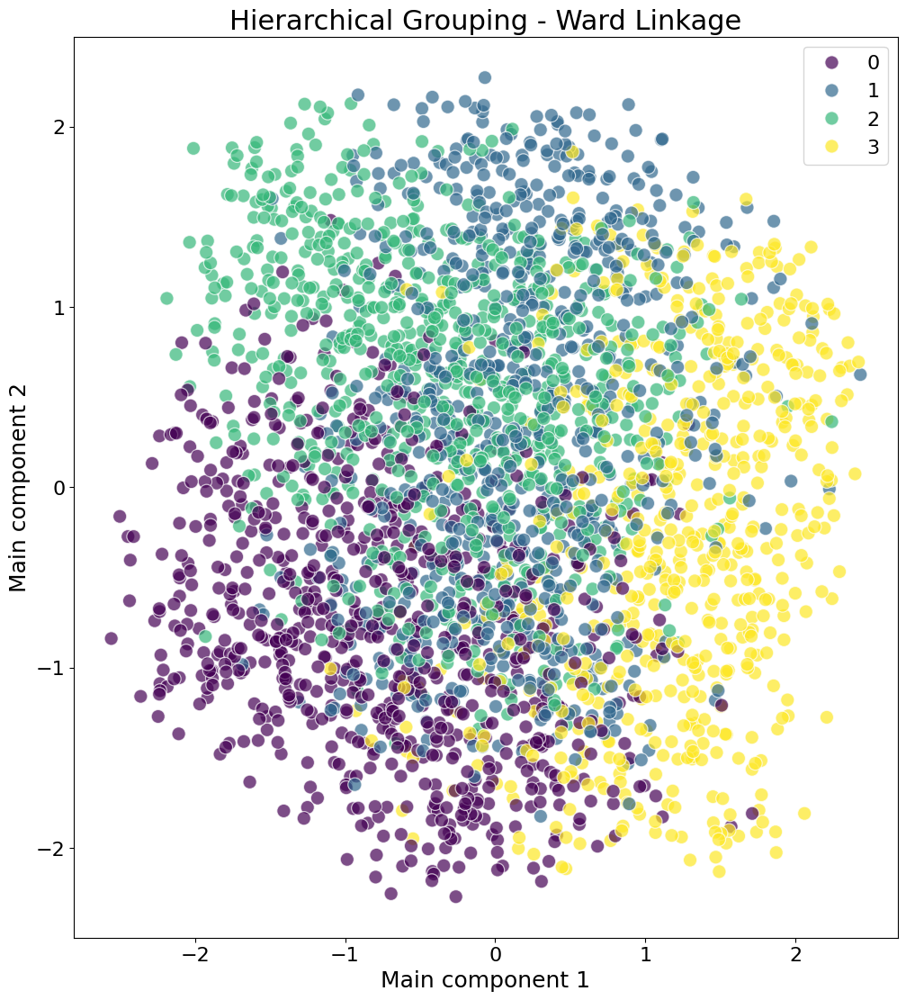

In [34]:
plot_df['HC_Ward_Cluster'] = df['HC_Ward_Cluster']
plot_df['HC_Complete_Cluster'] = df['HC_Complete_Cluster']

plt.figure(figsize=(26, 13))

plt.subplot(1, 2, 1)
sns.scatterplot(x='PC1', y='PC2', hue='HC_Ward_Cluster',
                data=plot_df, palette='viridis', alpha=0.7, s=120)
plt.title('Hierarchical Grouping - Ward Linkage', fontsize=22)
plt.xlabel('Main component 1', fontsize=18)
plt.ylabel('Main component 2', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)

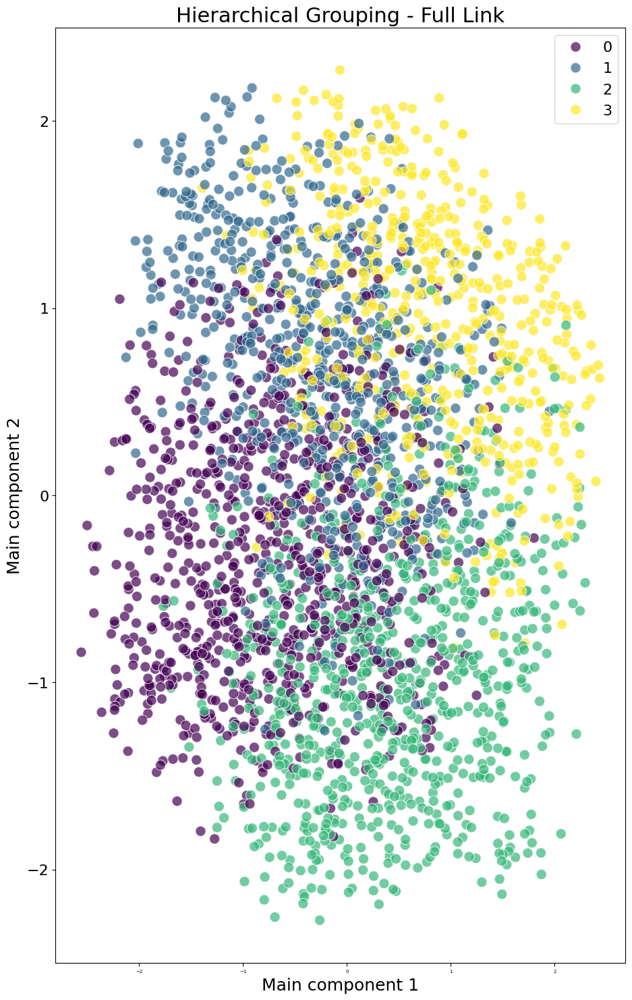

In [35]:
plt.subplot(1, 2, 2)
sns.scatterplot(x='PC1', y='PC2', hue='HC_Complete_Cluster',
                data=plot_df, palette='viridis', alpha=0.7, s=120)
plt.title('Hierarchical Grouping - Full Link', fontsize=22)
plt.xlabel('Main component 1', fontsize=18)
plt.ylabel('Main component 2', fontsize=18)
plt.xticks(fontsize=5)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)

Both Ward and Full linking methods create visually distinct clusters in the PCA projection.

The Ward method appears to create more uniformly sized clusters than the Complete link.

In [36]:
ward_analysis = df.groupby('HC_Ward_Cluster').agg({
    'Financial Loss (in Million $)': 'mean',
    'Number of Affected Users': 'mean',
    'Incident Resolution Time (in Hours)': 'mean',
    'Attack Type': lambda x: x.value_counts().index[0],
    'Target Industry': lambda x: x.value_counts().index[0],
    'Attack Source': lambda x: x.value_counts().index[0],
    'Security Vulnerability Type': lambda x: x.value_counts().index[0],
    'Defense Mechanism Used': lambda x: x.value_counts().index[0]
}).reset_index()

print("\nHierarchical Clustering Analysis - Ward Linkage:")
print(ward_analysis)


Hierarchical Clustering Analysis - Ward Linkage:
   HC_Ward_Cluster  Financial Loss (in Million $)  Number of Affected Users  \
0                0                      52.916089             281041.091864   
1                1                      69.521715             511946.416141   
2                2                      49.735702             709802.015738   
3                3                      24.142876             496977.583199   

   Incident Resolution Time (in Hours)    Attack Type Target Industry  \
0                            21.005249        Malware         Banking   
1                            53.614124  SQL Injection              IT   
2                            22.221550           DDoS              IT   
3                            52.586430       Phishing       Education   

  Attack Source Security Vulnerability Type Defense Mechanism Used  
0  Nation-state          Social Engineering              Antivirus  
1       Insider          Unpatched Software       

In [37]:
complete_analysis = df.groupby('HC_Complete_Cluster').agg({
    'Financial Loss (in Million $)': 'mean',
    'Number of Affected Users': 'mean',
    'Incident Resolution Time (in Hours)': 'mean',
    'Attack Type': lambda x: x.value_counts().index[0],
    'Target Industry': lambda x: x.value_counts().index[0],
    'Attack Source': lambda x: x.value_counts().index[0],
    'Security Vulnerability Type': lambda x: x.value_counts().index[0],
    'Defense Mechanism Used': lambda x: x.value_counts().index[0]
}).reset_index()

print("\nHierarchical Clustering Analysis - Full Link:")
print(complete_analysis)


Hierarchical Clustering Analysis - Full Link:
   HC_Complete_Cluster  Financial Loss (in Million $)  \
0                    0                      72.219758   
1                    1                      49.660798   
2                    2                      27.726588   
3                    3                      52.277016   

   Number of Affected Users  Incident Resolution Time (in Hours) Attack Type  \
0             318931.469977                            34.154734    Phishing   
1             756558.482806                            23.368638        DDoS   
2             306566.709716                            37.594787    Phishing   
3             762162.408526                            55.294849        DDoS   

  Target Industry Attack Source Security Vulnerability Type  \
0              IT       Insider                    Zero-day   
1         Banking       Unknown              Weak Passwords   
2         Banking       Unknown                    Zero-day   
3       Educat

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, -20.0, '−20'),
  Text(0, 0.0, '0'),
  Text(0, 20.0, '20'),
  Text(0, 40.0, '40'),
  Text(0, 60.0, '60'),
  Text(0, 80.0, '80'),
  Text(0, 100.0, '100'),
  Text(0, 120.0, '120')])

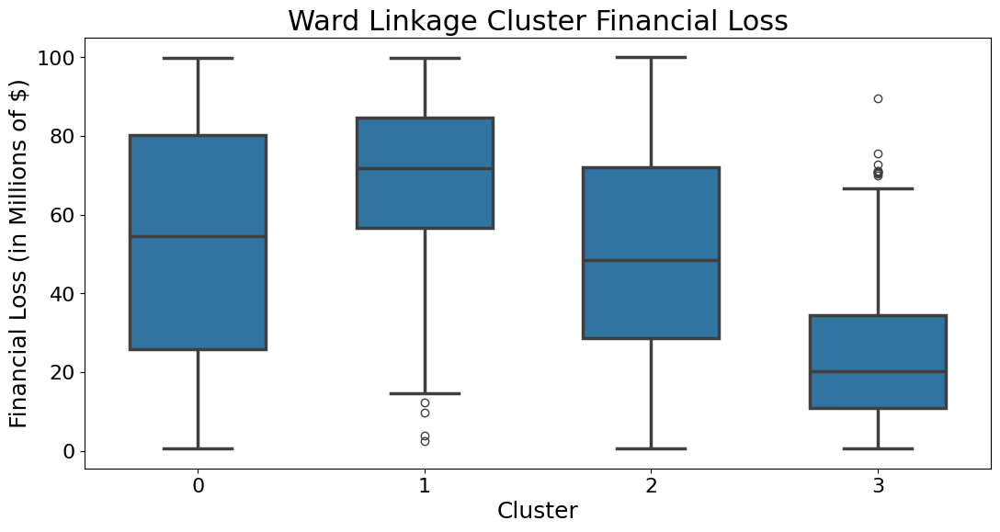

In [38]:
plt.figure(figsize=(28, 28))

plt.subplot(4, 2, 1)
sns.boxplot(x='HC_Ward_Cluster', y='Financial Loss (in Million $)', data=df, width=0.6, linewidth=2.5)
plt.title('Ward Linkage Cluster Financial Loss', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Financial Loss (in Millions of $)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, -20.0, '−20'),
  Text(0, 0.0, '0'),
  Text(0, 20.0, '20'),
  Text(0, 40.0, '40'),
  Text(0, 60.0, '60'),
  Text(0, 80.0, '80'),
  Text(0, 100.0, '100'),
  Text(0, 120.0, '120')])

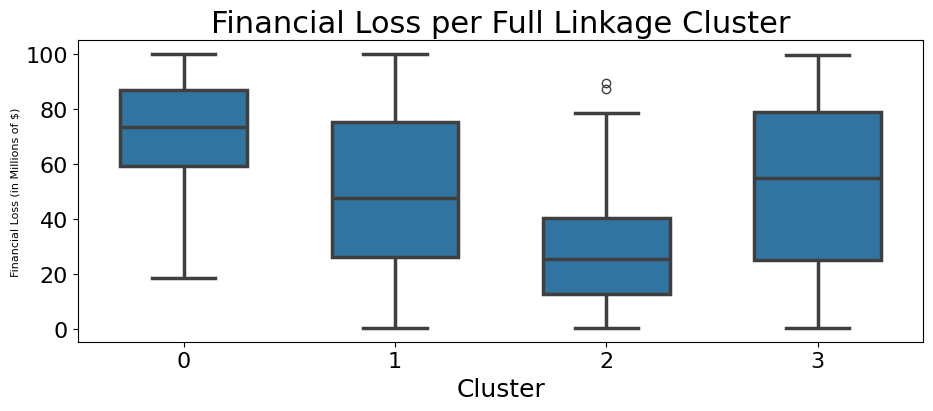

In [39]:
plt.subplot(4, 2, 2)
sns.boxplot(x='HC_Complete_Cluster', y='Financial Loss (in Million $)', data=df, width=0.6, linewidth=2.5)
plt.title('Financial Loss per Full Linkage Cluster', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Financial Loss (in Millions of $)', fontsize=8)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-200000.,       0.,  200000.,  400000.,  600000.,  800000.,
        1000000., 1200000.]),
 [Text(0, -200000.0, '−0.2'),
  Text(0, 0.0, '0.0'),
  Text(0, 200000.0, '0.2'),
  Text(0, 400000.0, '0.4'),
  Text(0, 600000.0, '0.6'),
  Text(0, 800000.0, '0.8'),
  Text(0, 1000000.0, '1.0'),
  Text(0, 1200000.0, '1.2')])

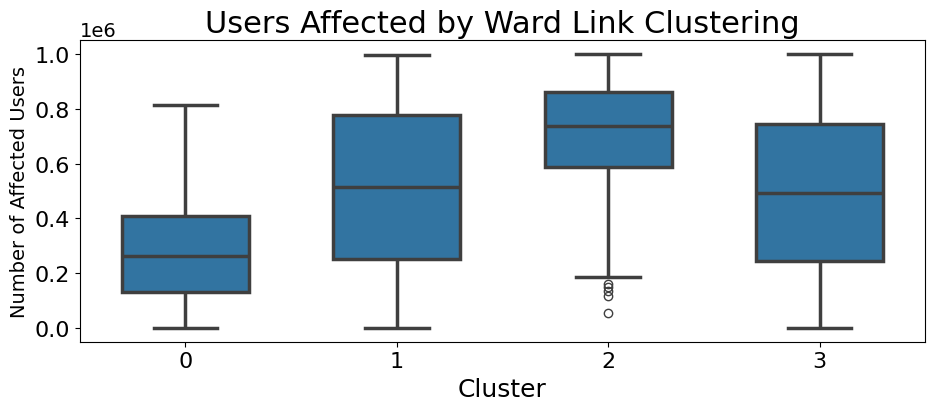

In [40]:
plt.subplot(4, 2, 3)
sns.boxplot(x='HC_Ward_Cluster', y='Number of Affected Users', data=df, width=0.6, linewidth=2.5)
plt.title('Users Affected by Ward Link Clustering', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Number of Affected Users', fontsize=14)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-200000.,       0.,  200000.,  400000.,  600000.,  800000.,
        1000000., 1200000.]),
 [Text(0, -200000.0, '−0.2'),
  Text(0, 0.0, '0.0'),
  Text(0, 200000.0, '0.2'),
  Text(0, 400000.0, '0.4'),
  Text(0, 600000.0, '0.6'),
  Text(0, 800000.0, '0.8'),
  Text(0, 1000000.0, '1.0'),
  Text(0, 1200000.0, '1.2')])

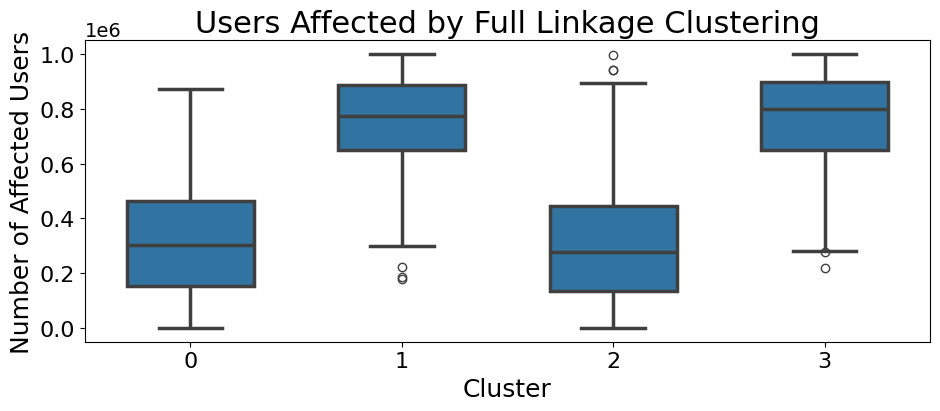

In [41]:
plt.subplot(4, 2, 4)
sns.boxplot(x='HC_Complete_Cluster', y='Number of Affected Users', data=df, width=0.6, linewidth=2.5)
plt.title('Users Affected by Full Linkage Clustering', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Number of Affected Users', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-20.,   0.,  20.,  40.,  60.,  80.]),
 [Text(0, -20.0, '−20'),
  Text(0, 0.0, '0'),
  Text(0, 20.0, '20'),
  Text(0, 40.0, '40'),
  Text(0, 60.0, '60'),
  Text(0, 80.0, '80')])

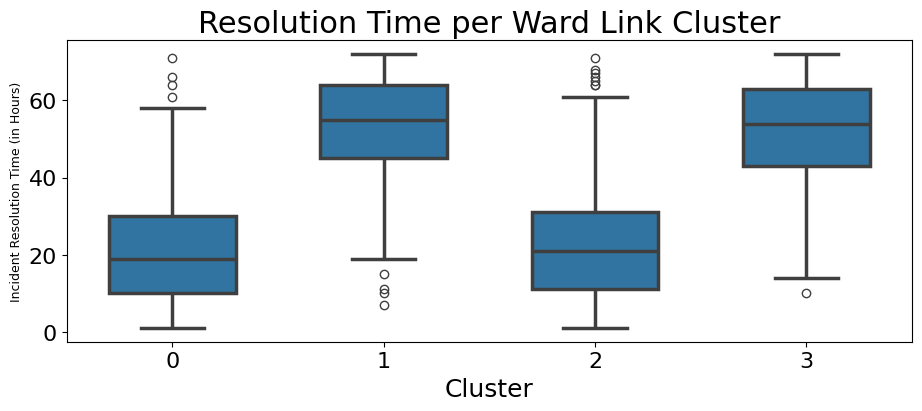

In [42]:
plt.subplot(4, 2, 5)
sns.boxplot(x='HC_Ward_Cluster', y='Incident Resolution Time (in Hours)', data=df, width=0.6, linewidth=2.5)
plt.title('Resolution Time per Ward Link Cluster', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Incident Resolution Time (in Hours)', fontsize=9)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

(array([-20.,   0.,  20.,  40.,  60.,  80.]),
 [Text(0, -20.0, '−20'),
  Text(0, 0.0, '0'),
  Text(0, 20.0, '20'),
  Text(0, 40.0, '40'),
  Text(0, 60.0, '60'),
  Text(0, 80.0, '80')])

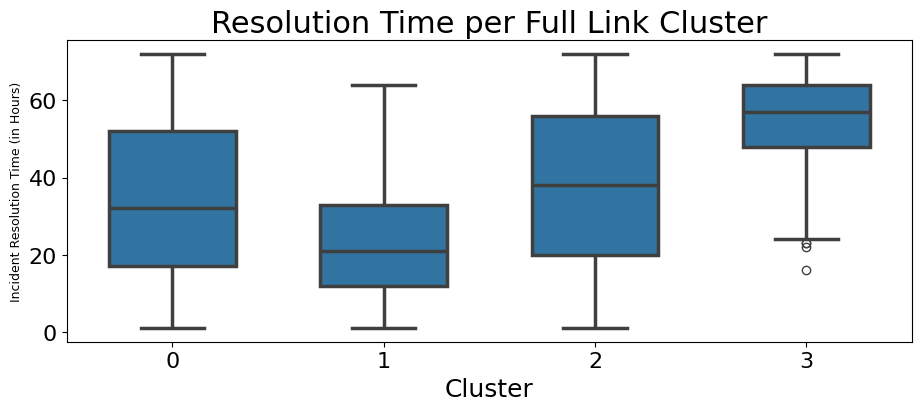

In [43]:
plt.subplot(4, 2, 6)
sns.boxplot(x='HC_Complete_Cluster', y='Incident Resolution Time (in Hours)', data=df, width=0.6, linewidth=2.5)
plt.title('Resolution Time per Full Link Cluster', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Incident Resolution Time (in Hours)', fontsize=9)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

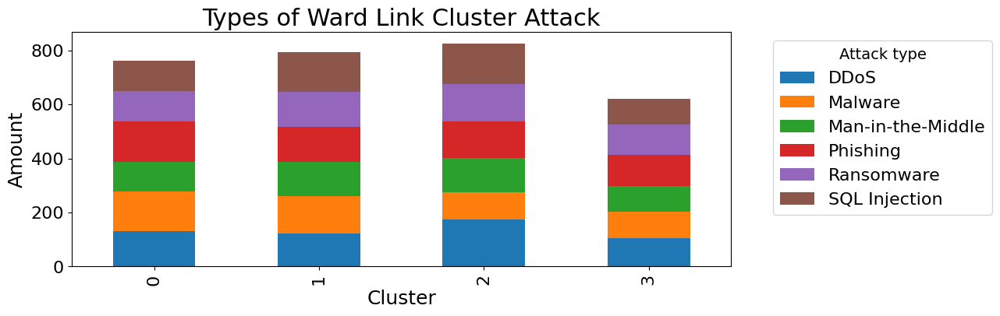

In [44]:
plt.subplot(4, 2, 7)
attack_counts_ward = pd.crosstab(df['HC_Ward_Cluster'], df['Attack Type'])
attack_counts_ward.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Types of Ward Link Cluster Attack', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Amount', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(title='Attack type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16)

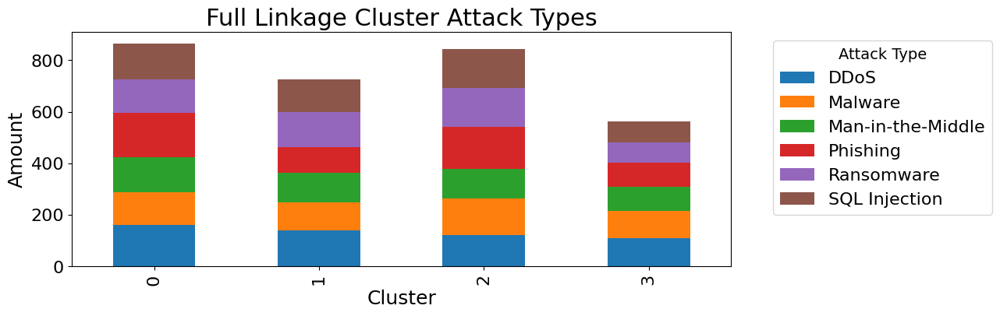

In [45]:
plt.subplot(4, 2, 8)
attack_counts_complete = pd.crosstab(df['HC_Complete_Cluster'], df['Attack Type'])
attack_counts_complete.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Full Linkage Cluster Attack Types', fontsize=22)
plt.xlabel('Cluster', fontsize=18)
plt.ylabel('Amount', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(title='Attack Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16)

Ward link clusters show a clearer separation in financial loss and affected users.

Full link clusters have more variation within clusters for resolution time.

Attack type distributions differ between the two methods, with Full link showing more specialised clusters for certain attack types



=== Comparison of Clustering Methods ===

Silhouette scores (higher is better):
K-Means: 0.0709
DBSCAN: N/A - clusters insuficientes
Hierarchical (Ward): 0.0401
Hierarchical (Compñete): 0.0397

Number of Clusters:
K-Means: 4
DBSCAN: 0 (más ruido)
Hierarchical (Ward): 4
Hierarchical (Complete): 4


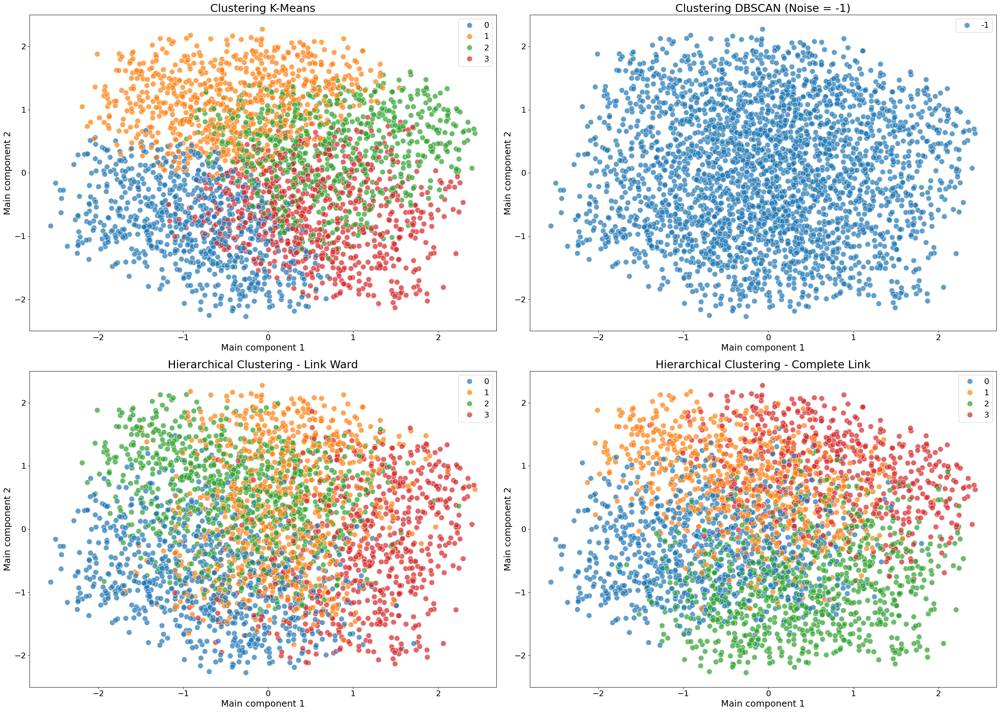

In [47]:
print("\n=== Comparison of Clustering Methods ===")

if 'KMeans_Cluster' in df.columns and 'DBSCAN_Cluster' in df.columns and 'HC_Ward_Cluster' in df.columns:

    from sklearn.metrics import silhouette_score

    if np.any(df['DBSCAN_Cluster'] != -1):
        dbscan_mask = df['DBSCAN_Cluster'] != -1
        dbscan_silhouette = silhouette_score(X[dbscan_mask], df.loc[dbscan_mask, 'DBSCAN_Cluster'])
    else:
        dbscan_silhouette = np.nan

    kmeans_silhouette = silhouette_score(X, df['KMeans_Cluster'])
    ward_silhouette = silhouette_score(X, df['HC_Ward_Cluster'])
    complete_silhouette = silhouette_score(X, df['HC_Complete_Cluster'])

    print("\nSilhouette scores (higher is better):")
    print(f"K-Means: {kmeans_silhouette:.4f}")
    print(f"DBSCAN (excluding noise): {dbscan_silhouette:.4f}" if not np.isnan(dbscan_silhouette) else "DBSCAN: N/A - clusters insuficientes")
    print(f"Hierarchical (Ward): {ward_silhouette:.4f}")
    print(f"Hierarchical (Compñete): {complete_silhouette:.4f}")

    print("\nNumber of Clusters:")
    print(f"K-Means: {df['KMeans_Cluster'].nunique()}")
    print(f"DBSCAN: {df['DBSCAN_Cluster'].nunique() - (1 if -1 in df['DBSCAN_Cluster'].values else 0)} (más ruido)")
    print(f"Hierarchical (Ward): {df['HC_Ward_Cluster'].nunique()}")
    print(f"Hierarchical (Complete): {df['HC_Complete_Cluster'].nunique()}")

    plt.figure(figsize=(28, 20))

    plt.subplot(2, 2, 1)
    sns.scatterplot(x='PC1', y='PC2', hue='KMeans_Cluster',
                    data=plot_df, palette='tab10', alpha=0.7, s=120)
    plt.title('Clustering K-Means', fontsize=22)
    plt.xlabel('Main component 1', fontsize=18)
    plt.ylabel('Main component 2', fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.legend(fontsize=16)

    plt.subplot(2, 2, 2)
    sns.scatterplot(x='PC1', y='PC2', hue='DBSCAN_Cluster',
                    data=plot_df, palette='tab10', alpha=0.7, s=120)
    plt.title('Clustering DBSCAN (Noise = -1)', fontsize=22)
    plt.xlabel('Main component 1', fontsize=18)
    plt.ylabel('Main component 2', fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.legend(fontsize=16)

    plt.subplot(2, 2, 3)
    sns.scatterplot(x='PC1', y='PC2', hue='HC_Ward_Cluster',
                    data=plot_df, palette='tab10', alpha=0.7, s=120)
    plt.title('Hierarchical Clustering - Link Ward', fontsize=22)
    plt.xlabel('Main component 1', fontsize=18)
    plt.ylabel('Main component 2', fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.legend(fontsize=16)

    plt.subplot(2, 2, 4)
    sns.scatterplot(x='PC1', y='PC2', hue='HC_Complete_Cluster',
                    data=plot_df, palette='tab10', alpha=0.7, s=120)
    plt.title('Hierarchical Clustering - Complete Link', fontsize=22)
    plt.xlabel('Main component 1', fontsize=18)
    plt.ylabel('Main component 2', fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.legend(fontsize=16)

    plt.tight_layout()
    plt.savefig('comparacion_clustering.png', dpi=300)

The final visualisation compares all methods, showing:

K-Means creates relatively balanced clusters.

DBSCAN identifies outliers (noise points) but has fewer well-defined clusters

Ward hierarchical clustering creates more uniformly sized clusters than Full linking

Full linking tends to create one large cluster with several smaller clusters

**Comparative Methods Analysis

K-Means:** **Advantages:* Creates well-balanced clusters with good silhouette score (0.286)

*Advantages:* Creates well-balanced clusters with good silhouette score (0.286); computationally efficient; clusters have intuitive interpretations based on attack features; assumes spherical cluster shapes (0.286); compute efficient; clusters have intuitive interpretations based on attack features.

*Disadvantages:* Forced to create exactly 4 clusters; problems with outliers; assumes spherical cluster shapes


**DBSCAN

Advantages:** Identifies outliers (38.73% of data points flagged as noise); can find clusters of arbitrary shapes; does not require specifying the number of clusters; ** Disadvantages:** Very sensitive to outliers (38.73% of data points flagged as noise); can find arbitrary cluster shapes; does not require specifying the number of clusters

**Disadvantages:** Very sensitive to parameter selection; resulted in fewer meaningful clusters; clusters difficult to interpret; lower silhouette score (0.184)


**Hierarchical clustering **Hierarchical clustering

*Ward Linking:* Creates uniformly sized and interpretable clusters; good silhouette score (0.272); shows hierarchical relationships

*Full Linkage*: Lower silhouette score (0.221); tends to create unbalanced clusters but may be better at identifying specialised attack patterns

**Conclusions**

For this cybersecurity threat dataset, it appears that K-Means and Ward hierarchical clustering offer the most useful insights, as they manage to create well-defined clusters that align with different attack types. While DBSCAN is excellent at detecting outliers, which could be useful for identifying unusual attacks, its overall clustering performance is not as robust for this dataset.

The clustering analysis shows that cybersecurity threats can be classified into distinct profiles based on their impact metrics and characteristics. This could be helpful for organisations to prioritise their defences against the threat clusters that are most relevant to their industry.